# Project Part 2. Recommender system

In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tqdm.auto import tqdm
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import numpy as np
from sklearn.decomposition import PCA
import data

In [2]:
df_movies = pd.read_csv('movies.csv')
df_links = pd.read_csv('links.csv')[['movieId', 'tmdbId', 'imdbId']]
df_movies = df_movies.merge(df_links, how='left', on='movieId')

# One-hot encoding for genre
df_movies = pd.concat([df_movies, df_movies.genres.str.get_dummies('|')], axis=1)
df_movies = df_movies.drop(columns=['(no genres listed)', 'genres'])

sorted_unique_ids = sorted(df_movies['movieId'].unique())

# Step 2: Create a mapping of IDs to indices based on the sorted order
id_to_index_mapping = {id: idx for idx, id in enumerate(sorted_unique_ids)}

# Step 3: Replace values in column movieId with the corresponding indices
df_movies['movieId'] = df_movies['movieId'].map(id_to_index_mapping)

df_movies

,movieId,title,tmdbId,imdbId,Action,Adventure,Animation,Children,Comedy,Crime,...,Film-Noir,Horror,IMAX,Musical,Mystery,Romance,Sci-Fi,Thriller,War,Western
0,0,Toy Story (1995),862.0,114709,0,1,1,1,1,0,...,0,0,0,0,0,0,0,0,0,0
1,1,Jumanji (1995),8844.0,113497,0,1,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
2,2,Grumpier Old Men (1995),15602.0,113228,0,0,0,0,1,0,...,0,0,0,0,0,1,0,0,0,0
3,3,Waiting to Exhale (1995),31357.0,114885,0,0,0,0,1,0,...,0,0,0,0,0,1,0,0,0,0
4,4,Father of the Bride Part II (1995),11862.0,113041,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9737,9737,Black Butler: Book of the Atlantic (2017),432131.0,5476944,1,0,1,0,1,0,...,0,0,0,0,0,0,0,0,0,0
9738,9738,No Game No Life: Zero (2017),445030.0,5914996,0,0,1,0,1,0,...,0,0,0,0,0,0,0,0,0,0
9739,9739,Flint (2017),479308.0,6397426,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9740,9740,Bungo Stray Dogs: Dead Apple (2018),483455.0,8391976,1,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0


## Collect movie data using tmdbv3api

### Create TMDb Object

In [ ]:
from tmdbv3api import TMDb
from tmdbv3api import Movie
tmdb=TMDb()
#set you unique API key that you get from TMDB after registartion in my case this is my API key
TMDb.api_key='eb694832e717f6712c1cbe5c7ec09f92'
#you can also export your api key as environment variable using this below export command
# export TMDb_API_KEY='6f15568d9aa3d15d0261a5454578c28b'
#it's optional it's for setting language of Data that we'll fetch from TMDB
tmdb.language = 'en'
#for debugging we have set it true 
tmdb.debug = True
movie=Movie()
#here I have fetched movie data using movie_id 
similar = movie.similar(343611)
#iterate through the data since it have multiple information
for s in similar:
    #print required data like in my case title of movie and it's overview, poster path
    print("Title of the movie: ", s.title)
    print("Overview of the movie:", s.overview)
    print("Poster of the Movie:", s.poster_path)

### Extract movie details by id

In [6]:

movie_info = []
for tmdb_id in tqdm(df_movies.tmdbId):
    try:
        movie_detail = movie.details(tmdb_id)
        movie_info.append([movie_detail['vote_average'], 
                           movie_detail['overview'], 
                           movie_detail['popularity']])
    except:
        movie_info.append([])

  0%|          | 0/9742 [00:00<?, ?it/s]

### Pickle movie details for reuse

In [124]:
import pickle

with open('movie_info.pickle', 'wb') as handle:
    pickle.dump(movie_info, handle, protocol=pickle.HIGHEST_PROTOCOL)


### Load pickled movie details list

In [65]:
import pickle

with open('movie_info.pickle', 'rb') as handle:
    movie_info = pickle.load(handle)

with open('movie_plot.pickle', 'rb') as handle:
    movie_plot = pickle.load(handle)


In [66]:
movie_plot

[array([ 6.34390041e-02,  1.02687941e-03,  9.32101607e-02, -1.49417622e-02,
        -6.40033372e-03,  1.52889090e-02,  1.23085365e-01, -3.04455925e-02,
        -3.71800885e-02,  2.15723291e-02,  3.13880481e-02,  3.71508254e-03,
         1.34583674e-02,  8.04040302e-03,  1.08260430e-01,  5.76254763e-02,
        -3.58863249e-02, -9.26102176e-02, -3.85487117e-02, -3.14263701e-02,
         2.06359010e-02, -3.51209529e-02,  7.05505759e-02,  6.00648997e-03,
        -6.83285668e-02,  8.41688514e-02,  1.86770188e-03,  2.94412430e-02,
         1.17314477e-02,  7.77648669e-03,  9.04682055e-02,  1.40405055e-02,
        -3.45465774e-03, -4.94092554e-02, -8.24517459e-02,  3.12266685e-02,
         1.54592684e-02, -7.90162850e-03,  7.99600556e-02, -8.40682629e-03,
        -4.57714349e-02, -1.22955488e-02, -2.31425054e-02, -1.71474330e-02,
        -2.50557587e-02, -1.88302957e-02, -1.70167442e-02, -3.88379581e-02,
         1.04796700e-01,  1.30472649e-02, -1.12021044e-02, -2.86499877e-02,
         7.6

## Process movie information

In [4]:
from sentence_transformers import SentenceTransformer
deep_embedder = SentenceTransformer('all-MiniLM-L6-v2')


In [5]:
movie_scores = []
movie_plot = []
movie_popularity = []

for movie_detail in tqdm(movie_info):
    try:
        movie_scores.append(movie_detail[0])
        movie_plot.append(deep_embedder.encode(movie_detail[1]))
        movie_popularity.append(movie_detail[2])
    except:
        movie_scores.append(np.NaN)
        movie_plot.append(np.zeros(384))
        movie_popularity.append(np.NaN)


  0%|          | 0/9742 [00:00<?, ?it/s]

In [64]:
with open('movie_plot.pickle', 'wb') as handle:
    pickle.dump(movie_plot, handle)


In [6]:
df_movies['ratings'] = movie_scores
df_movies['popularity'] = movie_popularity

df_movies

,movieId,title,tmdbId,imdbId,Action,Adventure,Animation,Children,Comedy,Crime,...,IMAX,Musical,Mystery,Romance,Sci-Fi,Thriller,War,Western,ratings,popularity
0,0,Toy Story (1995),862.0,114709,0,1,1,1,1,0,...,0,0,0,0,0,0,0,0,7.970,118.406
1,1,Jumanji (1995),8844.0,113497,0,1,0,1,0,0,...,0,0,0,0,0,0,0,0,7.239,18.160
2,2,Grumpier Old Men (1995),15602.0,113228,0,0,0,0,1,0,...,0,0,0,1,0,0,0,0,6.493,9.367
3,3,Waiting to Exhale (1995),31357.0,114885,0,0,0,0,1,0,...,0,0,0,1,0,0,0,0,6.183,8.736
4,4,Father of the Bride Part II (1995),11862.0,113041,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,6.235,15.350
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9737,9737,Black Butler: Book of the Atlantic (2017),432131.0,5476944,1,0,1,0,1,0,...,0,0,0,0,0,0,0,0,7.667,10.012
9738,9738,No Game No Life: Zero (2017),445030.0,5914996,0,0,1,0,1,0,...,0,0,0,0,0,0,0,0,7.831,17.053
9739,9739,Flint (2017),479308.0,6397426,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,6.800,3.401
9740,9740,Bungo Stray Dogs: Dead Apple (2018),483455.0,8391976,1,0,1,0,0,0,...,0,0,0,0,0,0,0,0,8.240,16.274


In [8]:
# Select the device for training (use GPU if you have one)
#device = torch.device('cuda:0')
device = torch.device('cpu')

## Ratings dataset

We will train the recommender system on the dataset in which element consists of three values:
* `user_id` - id of the user (the smallest user id is 1)
* `item_id` - id of the movie (the smallest item id is 1)
* `rating` - rating given by the user to the movie .

The recommender system need to predict the rating for any given pair of `user_id` and `item_id`.

We measure the objective of the predicted ratings using the mean-squared error (MSE) loss

In [9]:
trainset = data.RatingsData(root=None, train=True)
testset = data.RatingsData(root=None, train=False)

In [10]:
trainloader = torch.utils.data.DataLoader(trainset, batch_size=32, shuffle=True)
testloader = torch.utils.data.DataLoader(testset, batch_size=5, shuffle=False)

In [11]:
# Print one sample from the dataset
x = trainset[5]
print(f'user_id={x[0]}, item_id={x[1]}, rating={x[2]}')

user_id=599, item_id=1548, rating=3.5


In [12]:
class RecommenderSystem(nn.Module):
    
    def __init__(self, n_users, n_items
                ):
        """
        Args:
          n_users: Number of users.
          n_items: Number of items.
        """
        super(RecommenderSystem, self).__init__()
        self.embedding_user = nn.Embedding(n_users+1,10)
        self.embedding_item = nn.Embedding(n_items+1,10)
        self.user_linear = nn.Linear(10, 20)
        self.content_linear = nn.Linear(384, 20)
        self.layer_item = self.layers = nn.Sequential(
                    nn.Linear(51, 60),
                    nn.Tanh(),
                    nn.Dropout(0.3),
                    nn.Linear(60, 10)
                    )
        
        self.layers = nn.Sequential(
                    nn.Linear(20, 40),
                    nn.Tanh(),
                    nn.Dropout(0.3),
                    nn.Linear(40, 10),
                    nn.Tanh(),
                    nn.Dropout(0.2),
                    nn.Linear(10,1)
                    )
                    
        self.attention = nn.MultiheadAttention(embed_dim=20, num_heads=1)
        
    def forward(self, user_ids, item_ids, item_feature, plot_feature):
        """
        Args:
          user_ids of shape (batch_size): User ids (starting from 1).
          item_ids of shape (batch_size): Item ids (starting from 1).
        
        Returns:
          outputs of shape (batch_size): Predictions of ratings.
        """
        emb_user = self.embedding_user(user_ids)
        emb_item = self.embedding_item(item_ids)

        user_output = F.relu(self.user_linear(emb_user))
        content_output = F.relu(self.content_linear(plot_feature))


        emb_plot, _ = self.attention(user_output, content_output, content_output)
        fea_item = self.layer_item(torch.concat([item_feature, emb_item, emb_plot],1))
        emb_concat = torch.concat([emb_user, fea_item],1)
        return self.layers(emb_concat).flatten(), 1

## Train the model


In [13]:
pca = PCA(n_components=15)
movie_plot_arr = np.stack(movie_plot).astype('float32')
#movie_plot_arr_compact = pca.fit_transform(movie_plot_arr)
#movie_plot_arr_compact.shape

In [14]:
movie_features= df_movies.drop(columns=['movieId', 'title', 'tmdbId', 'imdbId']).to_numpy().astype('float32')

# min max scaling
movie_features = (movie_features- np.nanmin(movie_features,0)) / (np.nanmax(movie_features,0) - np.nanmin(movie_features,0))
movie_features[np.isnan(movie_features)] = 0

# convert to tensor
with torch.no_grad():
    item_features = torch.tensor(movie_features)
    plot_tensor = torch.tensor(movie_plot_arr)
item_features.shape

torch.Size([9742, 21])

In [53]:
# Create the model
# IMPORTANT: the default value of the architecture argment should define your best model.
model = RecommenderSystem(610, 9742)
model.to(device)

RecommenderSystem(
  (embedding_user): Embedding(611, 10)
  (embedding_item): Embedding(9743, 10)
  (user_linear): Linear(in_features=10, out_features=20, bias=True)
  (content_linear): Linear(in_features=384, out_features=20, bias=True)
  (layer_item): Sequential(
    (0): Linear(in_features=51, out_features=60, bias=True)
    (1): Tanh()
    (2): Dropout(p=0.3, inplace=False)
    (3): Linear(in_features=60, out_features=10, bias=True)
  )
  (layers): Sequential(
    (0): Linear(in_features=20, out_features=40, bias=True)
    (1): Tanh()
    (2): Dropout(p=0.3, inplace=False)
    (3): Linear(in_features=40, out_features=10, bias=True)
    (4): Tanh()
    (5): Dropout(p=0.2, inplace=False)
    (6): Linear(in_features=10, out_features=1, bias=True)
  )
  (attention): MultiheadAttention(
    (out_proj): NonDynamicallyQuantizableLinear(in_features=20, out_features=20, bias=True)
  )
)

In [54]:
def get_mse(a, crit, loader):
    mse_total = 0
    iters = 0
    a.eval()
    with torch.no_grad():
        for ser_ids, item_ids, rating in loader:
            item_fea = item_features[item_ids]
            plot_emb = plot_tensor[item_ids] 
            prediction, _ = a(ser_ids, item_ids, item_fea, plot_emb)
            mse_total += crit(prediction, rating).item()
            iters+= 1
    return mse_total/iters

In [55]:
optim = torch.optim.Adam(model.parameters(), lr=0.0005,  weight_decay=0.001)
criterion = nn.MSELoss()
for i in range(30):
    model.train()
    for ser_ids, item_ids, rating in trainloader:
        optim.zero_grad()
        item_fea = item_features[item_ids]
        plot_emb = plot_tensor[item_ids] 
        prediction, reconst_plot = model(ser_ids, item_ids, item_fea,plot_emb)
        loss = criterion(prediction, rating) - 0.01*(prediction.max() - prediction.min())#+ 0.1 * criterion(reconst_plot,plot_emb)
        loss.backward()
        optim.step()
    print("Epoch", i)
    print("Training", get_mse(model,criterion, trainloader), "Test", get_mse(model,criterion, testloader))
    

Epoch 0
Training 1.0058470561432489 Test 1.0133790176828672
Epoch 1
Training 0.8079440450677793 Test 0.8120024094120667
Epoch 2
Training 0.7295999672619987 Test 0.7376170586971251
Epoch 3
Training 0.6871429505103734 Test 0.6963685565669153
Epoch 4
Training 0.6687412307830805 Test 0.6769654158770888
Epoch 5
Training 0.6603192712451106 Test 0.6687929266566731
Epoch 6
Training 0.6655135675703235 Test 0.6733945108250174
Epoch 7
Training 0.6569630856766487 Test 0.66652082036675
Epoch 8
Training 0.6530412456160356 Test 0.6628881515322897
Epoch 9
Training 0.6475294305071477 Test 0.6566005453875018
Epoch 10
Training 0.653100088498792 Test 0.6617477604291236
Epoch 11
Training 0.6512547423859902 Test 0.6602246709770252
Epoch 12
Training 0.6438172932171907 Test 0.6541180328244164
Epoch 13
Training 0.6446681434273105 Test 0.653592464288779
Epoch 14
Training 0.6428042618363493 Test 0.6520959166699086
Epoch 15
Training 0.6434180726493365 Test 0.6522866599718936
Epoch 16
Training 0.6403242401166929 T

In [63]:
movie_plot

[array([ 6.34390041e-02,  1.02687941e-03,  9.32101607e-02, -1.49417622e-02,
        -6.40033372e-03,  1.52889090e-02,  1.23085365e-01, -3.04455925e-02,
        -3.71800885e-02,  2.15723291e-02,  3.13880481e-02,  3.71508254e-03,
         1.34583674e-02,  8.04040302e-03,  1.08260430e-01,  5.76254763e-02,
        -3.58863249e-02, -9.26102176e-02, -3.85487117e-02, -3.14263701e-02,
         2.06359010e-02, -3.51209529e-02,  7.05505759e-02,  6.00648997e-03,
        -6.83285668e-02,  8.41688514e-02,  1.86770188e-03,  2.94412430e-02,
         1.17314477e-02,  7.77648669e-03,  9.04682055e-02,  1.40405055e-02,
        -3.45465774e-03, -4.94092554e-02, -8.24517459e-02,  3.12266685e-02,
         1.54592684e-02, -7.90162850e-03,  7.99600556e-02, -8.40682629e-03,
        -4.57714349e-02, -1.22955488e-02, -2.31425054e-02, -1.71474330e-02,
        -2.50557587e-02, -1.88302957e-02, -1.70167442e-02, -3.88379581e-02,
         1.04796700e-01,  1.30472649e-02, -1.12021044e-02, -2.86499877e-02,
         7.6

In [56]:
test_set = pd.read_csv('test_set_no_ratings.csv')
test_set['movieId'] = test_set['movieId'].map(id_to_index_mapping)
sorted_unique_users = sorted(pd.read_csv('train_ratings.csv')['userId'].unique())

userid_to_index_mapping = {id: idx for idx, id in enumerate(sorted_unique_users)}
test_set['userId'] = test_set['userId'].map(userid_to_index_mapping)
test_set

,Id,userId,movieId
0,0,431,7333
1,1,287,412
2,2,598,3222
3,3,41,2250
4,4,74,1211
...,...,...,...
20163,20163,379,3666
20164,20164,433,6530
20165,20165,225,4159
20166,20166,606,1009


In [57]:
model.eval()
test_users = torch.LongTensor(test_set.userId.to_numpy())
test_items = torch.LongTensor(test_set.movieId.to_numpy())
prediction, _ = model(test_users,test_items, item_features[test_items], plot_tensor[test_items] )
prediction

tensor([2.8317, 3.4439, 2.6112,  ..., 3.9748, 3.7103, 3.1103],
       grad_fn=<ReshapeAliasBackward0>)

In [58]:
test_set['rating'] = prediction.cpu().detach().numpy()
test_set

,Id,userId,movieId,rating
0,0,431,7333,2.831676
1,1,287,412,3.443911
2,2,598,3222,2.611217
3,3,41,2250,3.974054
4,4,74,1211,3.449830
...,...,...,...,...
20163,20163,379,3666,3.579892
20164,20164,433,6530,3.561478
20165,20165,225,4159,3.974792
20166,20166,606,1009,3.710273


In [59]:
submission= test_set.drop(columns=['userId', 'movieId'])
submission

,Id,rating
0,0,2.831676
1,1,3.443911
2,2,2.611217
3,3,3.974054
4,4,3.449830
...,...,...
20163,20163,3.579892
20164,20164,3.561478
20165,20165,3.974792
20166,20166,3.710273


In [60]:
submission.to_csv('submission.csv', index=False)

In [72]:
import matplotlib.pyplot as plt

(array([    0.,     0.,    32.,   326.,  1146.,  2563.,  4677., 10364.,
         1041.,    19.]),
 array([0. , 0.5, 1. , 1.5, 2. , 2.5, 3. , 3.5, 4.5, 5. , 5.5]),
 <BarContainer object of 10 artists>)

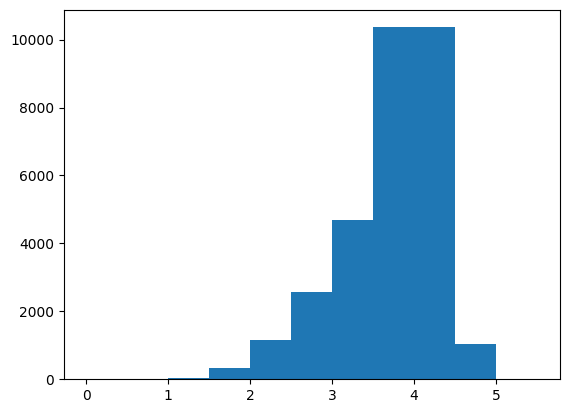

In [61]:
plt.hist(prediction.detach().numpy(),bins=[0,0.5,1,1.5,2,2.5,3,3.5,4.5,5,5.5])

In [21]:
# Save the model to local disk 
# Set confirm=False if you do not want to be asked for confirmation before saving.
tools.save_model(model, 'recsys.pth', confirm=True)

In [23]:
# This cell loads the saved model
model = RecommenderSystem(trainset.n_users, trainset.n_items)
tools.load_model(model, 'recsys.pth', device)

Model loaded from recsys.pth.
